## webdataset shards

In [1]:
%load_ext autoreload
%autoreload 2
from IPython.display import display
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


import pandas as pd
from pathlib import Path
from icecream import ic
from rich import print as pp
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from imutils.big.datamodule import Herbarium2022DataModule, Herbarium2022Dataset

Importing imutils
ASSETS_DIR: /media/data/jacob/GitHub/image-utils/assets
SAMPLE_IMAGE_PATHS: [PosixPath('/media/data/jacob/GitHub/image-utils/assets/Ericaceae_Zenobia_pulverulenta_7984 {WolfeUSGS} [1.96x].jpg'), PosixPath('/media/data/jacob/GitHub/image-utils/assets/Ericaceae_Arbutus_densiflora_1440 {WolfeUSGS} [1.96x].jpg')]


In [2]:
from torchvision import transforms as T
import argparse
from rich import print as pp

In [3]:
def read_file_binary(fname):
    "Read a binary file from disk."
    with open(fname, "rb") as stream:
        return stream.read()


### Mock config yaml

In [5]:
%reload_ext yamlmagic

In [6]:
%%yaml config

preprocess:
    train:
        resize: 512
    val:
        resize: 256
batch_transform:
    train:
        random_resize_crop: 224
    val:
        center_crop: 224
normalize:
   - [0.485, 0.456, 0.406]
   - [0.229, 0.224, 0.225]

<IPython.core.display.Javascript object>

In [7]:
pp(config)
pp(type(config))

{
    'preprocess': {'train': {'resize': 512}, 'val': {'resize': 256}},
    'batch_transform': {'train': {'random_resize_crop': 224}, 'val': {'center_crop': 224}},
    'normalize': [[0.485, 0.456, 0.406], [0.229, 0.224, 0.225]]
}

<class 'dict'>

In [6]:
# from torchvision import transforms as T
# import argparse
# from rich import print as pp

# args = argparse.Namespace(
#     preprocess={
#         "train":{
#             "resize":512
#         },
#         "val":{
#             "resize":256
#         },
#     },
#     batch_transform={
#         "train":{
#             "random_resize_crop":224
#         },
#         "val":{
#             "center_crop":224
#         },
#     normalize=(
#        [0.485, 0.456, 0.406],
#        [0.229, 0.224, 0.225]
#     )
#     }
# )
# pp(args)

Namespace(batch_transform={'train': {'random_resize_crop': 224}, 'val': {'center_crop': 
224}}, preprocess={'train': {'resize': 512}, 'val': {'resize': 256}})

In [ ]:
# kornia_transform = nn.Sequential(
#     K.RandomHorizontalFlip(),
#     K.RandomVerticalFlip(),
#     K.RandomMotionBlur(3, 35., 0.5),
#     K.RandomRotation(degrees=45.0),
#     K.Normalize(mean=mean_std,std=mean_std)
# )

In [15]:
import numpy as np
from torch import nn
import torch
from albumentations.augmentations import transforms as AT

to_tensor = T.ToTensor()

class Preprocess(nn.Module):

    def __init__(self, mode="train", resize=None):
        super().__init__()
        self.mode = mode
        self.resize = resize        
        self.resize_func = T.Resize(self.resize)
    
    @torch.no_grad()  # disable gradients for effiency
    def forward(self, x) -> torch.Tensor:
        # x_tmp: np.ndarray = np.array(x)  # HxWxC
        # x_out: Tensor = to_tensor(x_tmp, keepdim=True)  # CxHxW
        if self.resize:
            x = self.resize_func(x)

        return x #_out.float()# / 255.0




class BatchTransforms(nn.Module):
    """Module to perform data augmentation using Kornia on torch tensors."""

    def __init__(self,
                 mode: str="train",
                 random_resize_crop=None,
                 center_crop=None,
                 apply_color_jitter: bool = False,
                 normalize = (
                     [0,0,0],
                     [1,1,1]
                 )
                ) -> None:
        super().__init__()
        self.mode = mode
        self.random_resize_crop = random_resize_crop
        self.center_crop = center_crop
        self._apply_color_jitter = apply_color_jitter
        self.normalize = normalize
        
        self.build_transforms(mode=mode)

        
    def add_train_transforms(self, transforms=None):
        
        transforms = transforms or []
        # if mode == "train":
        transforms.append(T.RandomPerspective())
        if type(self.random_resize_crop) == int:
            transforms.append(T.RandomResizedCrop(self.random_resize_crop))
        transforms.extend([
            T.RandomHorizontalFlip(),
            T.RandomVerticalFlip()
        ])
        return transforms

    def add_test_transforms(self, transforms=None):
        
        transforms = transforms or []
        if type(self.center_crop) == int:
            transforms.append(T.CenterCrop(self.center_crop))
        return transforms


    def build_transforms(self,
                         mode: str = "train"):
        transforms = []
        if mode == "train":
            transforms = self.add_train_transforms(transforms=transforms)
        elif mode in ["val", "test"]:
            transforms = self.add_test_transforms(transforms=transforms)

        transforms.extend([
			# T.ToTensor(),
			T.Normalize(*self.normalize)
        ])

        self.transforms = nn.Sequential(*transforms)
        self.jitter = AT.ColorJitter(brightness=0.2,
                                     contrast=0.2,
                                     saturation=0.2,
                                     hue=0.2,
                                     always_apply=False,
                                     p=0.5)

    @torch.no_grad()  # disable gradients for effiency
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x_out = self.transforms(x)  # BxCxHxW
        if self._apply_color_jitter:
            x_out = self.jitter(x_out)
        return x_out

In [16]:
from typing import *


def get_default_transforms(
        mode: str="train",
        preprocess={
            'train': {'resize': 512},
            'val': {'resize': 256}},

        batch_transform={
            'train': {'random_resize_crop': 224}, 
            'val': {'center_crop': 224}},
        normalize=(
            [0.485, 0.456, 0.406],
            [0.229, 0.224, 0.225]
        )
    ) -> Tuple[Callable]:
    
    preprocess_transforms = Preprocess(mode=mode, 
                                       resize=config["preprocess"][mode]["resize"])
    
    batch_transforms = BatchTransforms(mode=mode,
                                       random_resize_crop=None, #config["batch_transform"]["val"]["random_resize_crop"],
                                       center_crop=None, #config["batch_transform"]["val"]["center_crop"],
                                       apply_color_jitter = False,
                                       normalize = normalize)
    
    return preprocess_transforms, batch_transforms


train_preprocess_transforms, train_batch_transforms = get_default_transforms(mode="train",
                                                                             **config)

val_preprocess_transforms, val_batch_transforms = get_default_transforms(mode="val",
                                                                         **config)

In [37]:
%%time

import tarfile
tarfile.DEFAULT_FORMAT = tarfile.GNU_FORMAT

import webdataset as wds

CATALOG_DIR = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/catalog"
SHARD_DIR = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset"

num_workers = 4
batch_size = 128
shuffle_buffer = 1000

worker_batch_size = np.ceil(batch_size//num_workers)


url = SHARD_DIR + '/herbarium_2022-train-{000000..000020}.tar'

# import braceexpand
# shards = list(braceexpand.braceexpand("{000000..000554}"))
# pp(shards)

dataset = wds.WebDataset(url) \
                .decode("torchrgb") \
                .to_tuple("image.jpg","label.cls","__key__") \
                .map_tuple(train_preprocess_transforms, None, None) \
                .batched(worker_batch_size)


loader = wds.WebLoader(dataset,
                       num_workers=num_workers,
                       batch_size=None)

train_batch_transforms = train_batch_transforms.cuda()
loader = loader.unbatched() \
               .shuffle(shuffle_buffer) \
               .batched(batch_size) \
               .map_tuple(train_batch_transforms, None, None)

batch = next(iter(loader))

CPU times: user 12.9 s, sys: 4.38 s, total: 17.3 s
Wall time: 9.29 s


In [40]:
import jpeg4py as jpeg




In [38]:
%%time
from tqdm import tqdm
# batch_size = 32
num_samples_in_shard = 4135
# batches_per_epoch = num_samples_in_shard//batch_size

batches_per_epoch = 20

total = 0
for item in tqdm(iter(loader), total=batches_per_epoch): #len(dataset)):
    total += len(item[0])

    if total > batches_per_epoch*batch_size:
        break

print(f"{total} samples processed")

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [01:15<00:00,  3.77s/it]


2688 samples processed
CPU times: user 7min 9s, sys: 56.9 s, total: 8min 5s
Wall time: 1min 17s


In [35]:
2688/83

32.3855421686747

In [32]:
704/26.1

26.973180076628353

In [29]:
352/14

25.142857142857142

In [59]:
CATALOG_DIR = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/catalog"

datamodule = Herbarium2022DataModule(catalog_dir=CATALOG_DIR,
                                     num_workers=4,
                                     # image_reader=read_file_binary,
                                     remove_transforms=True)
datamodule.setup()

In [60]:
subset = "train"
dataset = datamodule.get_dataset(subset=subset)

In [102]:
dataset.num_classes

15501

### Image Compressor

In [ ]:
# # pip install Pillow
# import PIL
# from PIL import Image
# img = PIL.Image.open('test_image.jpg')
# H, W = img.size
# compress = Image.resize((H, W), PIL.Image.ANTIALIAS)
# compress.save("compress.jpg")

### Compare images

In [ ]:
# # pip install Pillow
# from PIL import Image
# from PIL import ImageChops
# def compare(image1, image2):
#     im1 = Image.open(image1)
#     im2 = Image.open(image2)
# diff = ImageChops.difference(im2, im1)
#     if diff.getbbox():
#         diff.show()
#     else:
#         return None
# compare("img1.png", "img2.png")

In [3]:
# for subset in ["train","val", "test"]:
#     data = Herbarium2022Dataset(subset=subset,
#                                 label_col="scientificName",
#                                 train_size=0.7,
#                                 shuffle=(subset != "test"),
#                                 seed=14,
#                                 transform=None)

#########################################

CATALOG_DIR = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/catalog"
SHARD_DIR = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset"

# datamodule = Herbarium2022DataModule(catalog_dir=CATALOG_DIR,
#                                      batch_size=64,
#                                      num_workers=4,
#                                      image_reader=read_file_binary,
#                                      remove_transforms=True)
# datamodule.setup()


# train_dataloader = datamodule.train_dataloader()
# train_batch = next(iter(train_dataloader))
# datamodule.train_dataset.encoder.inverse_transform(train_batch[1])

In [4]:
import numpy as np
import os
from typing import Optional, Tuple, Any, Dict
from tqdm import trange, tqdm

import tarfile
tarfile.DEFAULT_FORMAT = tarfile.GNU_FORMAT

import webdataset as wds


def read_file_binary(fname):
    "Read a binary file from disk."
    with open(fname, "rb") as stream:
        return stream.read()

all_keys = set()

def prepare_sample(dataset, index, subset: str="train") -> Dict[str, Any]:
    image_binary, label, metadata = dataset[index]

    key = metadata["catalog_number"]
    assert key not in all_keys
    all_keys.add(key)

    xkey = key if filekey else "%07d" % index
    sample = {"__key__": xkey, 
              "image.jpg": image_binary}
    
    if subset != "test":
        assert label == dataset.targets[index]
        sample["label.cls"] = int(label)
    
    return sample

    
def write_dataset(catalog_dir: Optional[str]=None,
                  shard_dir: Optional[str]=None,
                  subset="train",
                  maxsize=1e9,
                  maxcount=100000,
                  limit_num_samples: Optional[int]=np.inf,
                  filekey: bool=False,
                  dataset=None):

    if dataset is None:
        datamodule = Herbarium2022DataModule(catalog_dir=catalog_dir,
                                             num_workers=4,
                                             image_reader=read_file_binary,
                                             remove_transforms=True)
        datamodule.setup()
        dataset = datamodule.get_dataset(subset=subset)
    
    num_samples = len(dataset)
    print(f"With subset={subset}, Total num_samples: {num_samples}")
    
    if limit_num_samples < num_samples:
        num_samples = limit_num_samples
        print(f"Limiting this run to num_samples: {num_samples}")
    indices = list(range(num_samples))

    os.makedirs(shard_dir, exist_ok=True)
    pattern = os.path.join(shard_dir, f"herbarium_2022-{subset}-%06d.tar")

    with wds.ShardWriter(pattern, maxsize=maxsize, maxcount=maxcount) as sink:
        for i in tqdm(indices):
            
            sample = prepare_sample(dataset, index=i, subset=subset)
            sink.write(sample)


    return dataset, indices

In [5]:
dataset=None

In [7]:
%%time

CATALOG_DIR = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/catalog"
SHARD_DIR = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset"



dataset, indices = write_dataset(catalog_dir=CATALOG_DIR,
                                shard_dir=SHARD_DIR,
                                subset="val",
                                maxsize=1e9,
                                maxcount=100000,
                                limit_num_samples=1000,
                                filekey=False,
                                dataset=dataset)

training dataset length: 587840
validation dataset length: 251932
test dataset length: 210407
With subset=val, Total num_samples: 251932
Limiting this run to num_samples: 1000
# writing /media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset/herbarium_2022-val-000000.tar 0 0.0 GB 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:27<00:00, 36.27it/s]


CPU times: user 12.2 s, sys: 4.02 s, total: 16.2 s
Wall time: 42.5 s


In [12]:

!tar tvf '{SHARD_DIR}/herbarium_2022-val-000000.tar' | sed 6q

-r--r--r-- bigdata/bigdata 289678 2022-03-14 02:05 0000000.image.jpg
-r--r--r-- bigdata/bigdata      4 2022-03-14 02:05 0000000.label.cls
-r--r--r-- bigdata/bigdata 169523 2022-03-14 02:05 0000001.image.jpg
-r--r--r-- bigdata/bigdata      4 2022-03-14 02:05 0000001.label.cls
-r--r--r-- bigdata/bigdata 255094 2022-03-14 02:05 0000002.image.jpg
-r--r--r-- bigdata/bigdata      4 2022-03-14 02:05 0000002.label.cls
tar: write error


In [33]:
shard_path = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset/herbarium_2022-train-000000.tar"

!tar tvf '{shard_path}' | sed 6q

-r--r--r-- bigdata/bigdata 200820 2022-03-14 03:16 0000000.image.jpg
-r--r--r-- bigdata/bigdata      5 2022-03-14 03:16 0000000.label.cls
-r--r--r-- bigdata/bigdata 211515 2022-03-14 03:16 0000001.image.jpg
-r--r--r-- bigdata/bigdata      4 2022-03-14 03:16 0000001.label.cls
-r--r--r-- bigdata/bigdata 210007 2022-03-14 03:16 0000002.image.jpg
-r--r--r-- bigdata/bigdata      5 2022-03-14 03:16 0000002.label.cls
tar: write error


In [32]:
shard_path = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset/herbarium_2022-val-000000.tar"

!tar tvf '{shard_path}' | sed 6q

-r--r--r-- bigdata/bigdata 289678 2022-03-14 03:16 0000000.image.jpg
-r--r--r-- bigdata/bigdata      4 2022-03-14 03:16 0000000.label.cls
-r--r--r-- bigdata/bigdata 169523 2022-03-14 03:16 0000001.image.jpg
-r--r--r-- bigdata/bigdata      4 2022-03-14 03:16 0000001.label.cls
-r--r--r-- bigdata/bigdata 255094 2022-03-14 03:16 0000002.image.jpg
-r--r--r-- bigdata/bigdata      4 2022-03-14 03:16 0000002.label.cls
tar: write error


In [34]:
shard_path = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset/herbarium_2022-test-000000.tar"

!tar tvf '{shard_path}' | sed 6q

-r--r--r-- bigdata/bigdata 194809 2022-03-14 03:17 0000000.image.jpg
-r--r--r-- bigdata/bigdata 390043 2022-03-14 03:17 0000001.image.jpg
-r--r--r-- bigdata/bigdata 279678 2022-03-14 03:17 0000002.image.jpg
-r--r--r-- bigdata/bigdata 210863 2022-03-14 03:17 0000003.image.jpg
-r--r--r-- bigdata/bigdata 351952 2022-03-14 03:17 0000004.image.jpg
-r--r--r-- bigdata/bigdata 292749 2022-03-14 03:17 0000005.image.jpg
tar: write error


In [3]:
import torch

### albumentations

In [ ]:
# import albumentations as A
# import cv2


# def Transform(phase: str):
#     if phase == 'train':
#         return Compose([
#             A.RandomResizedCrop(height=CFG.img_size, width=CFG.img_size),
#             A.HorizontalFlip(p=0.5),
#             A.ShiftScaleRotate(p=0.5),
#             A.RandomBrightnessContrast(p=0.5),
#             A.Normalize(),
#             ToTensorV2(),
#         ])
#     else:
#         return A.Compose([
#             A.Resize(height=CFG.img_size, width=CFG.img_size),
#             A.Normalize(),
#             ToTensorV2(),
#         ])



# train_transform = A.Compose(
#     [
#         A.SmallestMaxSize(max_size=160),
#         A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
#         A.RandomCrop(height=128, width=128),
#         A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
#         A.RandomBrightnessContrast(p=0.5),
#         A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
#         ToTensorV2(),
#     ]
# )
# train_dataset = CatsVsDogsDataset(images_filepaths=train_images_filepaths, transform=train_transform)
# val_transform = A.Compose(
#     [
#         A.SmallestMaxSize(max_size=160),
#         A.CenterCrop(height=128, width=128),
#         A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
#         ToTensorV2(),
#     ]
# )
# val_dataset = CatsVsDogsDataset(images_filepaths=val_images_filepaths, transform=val_transform)
# Also let's define a function that takes a dataset and visualizes different augmentations applied to the same image.

# def visualize_augmentations(dataset, idx=0, samples=10, cols=5):
#     dataset = copy.deepcopy(dataset)
#     dataset.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (A.Normalize, ToTensorV2))])
#     rows = samples // cols
#     figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(12, 6))
#     for i in range(samples):
#         image, _ = dataset[idx]
#         ax.ravel()[i].imshow(image)
#         ax.ravel()[i].set_axis_off()
#     plt.tight_layout()
#     plt.show()


In [ ]:
trainer.fit(model, datamodule)

In [ ]:
            checkpoint_callback = [c for c in callbacks if isinstance(c, pl.callbacks.ModelCheckpoint)][0]
            logging.info(f"checkpoint_callback.best_model_path: {str(checkpoint_callback.best_model_path)}")
            config.system.tasks[f"task_{task_id}"].ckpt_path = checkpoint_callback.best_model_path
            checkpoint_callback.best_model_score = checkpoint_callback.best_model_score or 0.0
            logging.info(f"checkpoint_callback.best_model_score: {checkpoint_callback.best_model_score:.3f}")
        logging.info(f"[Initiating TESTING on task_{task_id}]")


        test_results = run_multitask_test(trainer=trainer,
                                          model=model,
                                          datamodule=datamodule,
                                          config=config,
                                          tasks="all")#,

### GPU augmentations

In [ ]:
class Preprocess(nn.Module):
    """Module to perform pre-process using Kornia on torch tensors."""

    @torch.no_grad()  # disable gradients for effiency
    def forward(self, x) -> Tensor:
        x_tmp: np.ndarray = np.array(x)  # HxWxC
        x_out: Tensor = image_to_tensor(x_tmp, keepdim=True)  # CxHxW
        return x_out.float() / 255.0

class DataAugmentation(nn.Module):
    """Module to perform data augmentation using Kornia on torch tensors."""

    def __init__(self, apply_color_jitter: bool = False) -> None:
        super().__init__()
        self._apply_color_jitter = apply_color_jitter

        self.transforms = nn.Sequential(
            RandomHorizontalFlip(p=0.75),
            RandomChannelShuffle(p=0.75),
            RandomThinPlateSpline(p=0.75),
        )

        self.jitter = ColorJitter(0.5, 0.5, 0.5, 0.5)

    @torch.no_grad()  # disable gradients for effiency
    def forward(self, x: Tensor) -> Tensor:
        x_out = self.transforms(x)  # BxCxHxW
        if self._apply_color_jitter:
            x_out = self.jitter(x_out)
        return x_out

In [54]:
%%time

batch_size = 32
shuffle_buffer = 1000


worker_batch_size == np.ceil(batch_size//num_workers)


url = f'{SHARD_DIR}/herbarium_2022-train-000000.tar'

dataset = wds.WebDataset(url) \
                .decode("rgb") \
                .to_tuple("image.jpg","label.cls","__key__") \
                .map_tuple(transforms, None, None) \
                .batched(worker_batch_size)


loader = wds.WebLoader(dataset,
                       num_workers=4,
                       batch_size=None)
loader = loader.unbatched() \
               .shuffle(shuffle_buffer) \
               .batched(batch_size)

batch = next(iter(loader))

CPU times: user 2.63 s, sys: 930 ms, total: 3.56 s
Wall time: 6.15 s


In [ ]:


dataset = wds.WebDataset(shards).shuffle(1000) ... .
loader = wds.WebLoader(dataset, num_workers=num_workers, batch_size=None)
loader = loader.unbatched().shuffle(1000).batched(batch_size)


In [57]:
%%time
# batch_size = 32
num_samples_in_shard = 4135
for item in tqdm(iter(loader), total=num_samples_in_shard//batch_size): #len(dataset)):
    # break
    pass

print(type(item), len(item))
print(item[0].shape)



In [59]:
CATALOG_DIR = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/catalog"

datamodule = Herbarium2022DataModule(catalog_dir=CATALOG_DIR,
                                     num_workers=4,
                                     # image_reader=read_file_binary,
                                     remove_transforms=True)
datamodule.setup()

In [60]:
subset = "train"
dataset = datamodule.get_dataset(subset=subset)

In [102]:
dataset.num_classes

15501

In [62]:
len(dataset)

587840

In [89]:
%%bash

showfiles() {
rm -rf temp
mkdir temp
progress_los=/dev/null info_log=/dev/null tarp cat --rekey='#' --slice :18 - -o - | tar -C temp -xf -montage temp/*.jpg -geometry '64x64>+2+2' -tile 9x2 | display
}

In [90]:
shard_path = "/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset/herbarium_2022-train-000001.tar"

In [100]:
%%bash

showfiles() {
rm -rf temp
mkdir temp
progress_los=/dev/null info_log=/dev/null tarp cat --rekey='#' --slice :18 - -o - | tar -C temp -xf -montage temp/*.jpg -geometry '64x64>+2+2' -tile 9x2 | display
}
shard_path="/media/data_cifs/projects/prj_fossils/users/jacob/data/herbarium_2022/webdataset/herbarium_2022-train-000001.tar"

cat "$shard_path" | showfiles



In [ ]:
tarp cat 

In [67]:
%%time
from rich import print as pp
from collections import Counter

shapes = []

for i in trange(2000,2300):
    img, label, metadata = dataset[i]
    # break
    shapes.append((i, img.size)) #, label, metadata))
    known_broken_img_name
img.size

counts = Counter([shape[1] for shape in shapes])
pp(counts)
# dir(img)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 300/300 [00:17<00:00, 16.94it/s]


Counter({(960, 960): 299, (460, 460): 1})

CPU times: user 674 ms, sys: 504 ms, total: 1.18 s
Wall time: 17.7 s


(10407,
 {'path': '/media/data_cifs/projects/prj_fossils/data/raw_data/herbarium-2022-fgvc9_resize/train_images/104/11/10411__104.jpg',
  'catalog_number': '10411__104'})

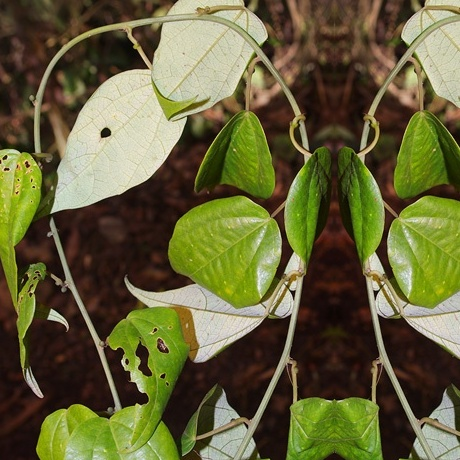

In [73]:
dataset[2052][1:]
dataset[2052][0]

(9855,
 {'path': '/media/data_cifs/projects/prj_fossils/data/raw_data/herbarium-2022-fgvc9_resize/train_images/098/59/09859__023.jpg',
  'catalog_number': '09859__023'})

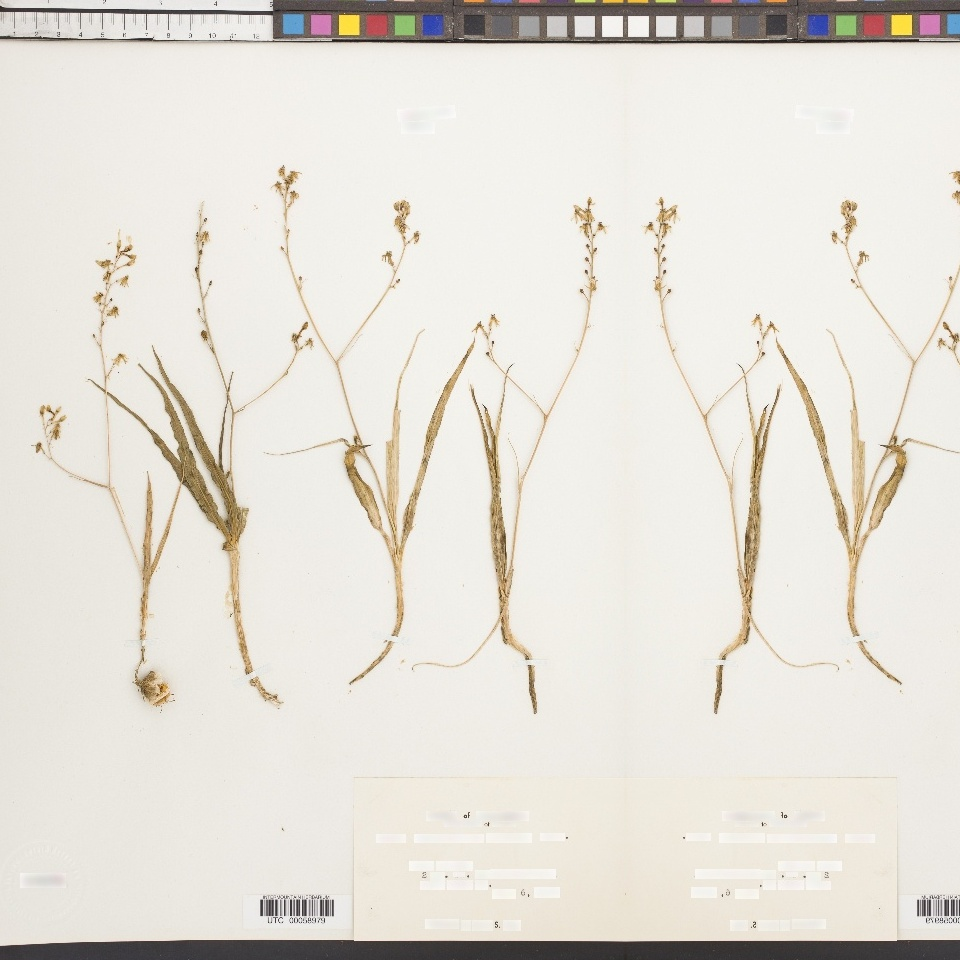

(13853,
 {'path': '/media/data_cifs/projects/prj_fossils/data/raw_data/herbarium-2022-fgvc9_resize/train_images/138/57/13857__035.jpg',
  'catalog_number': '13857__035'})

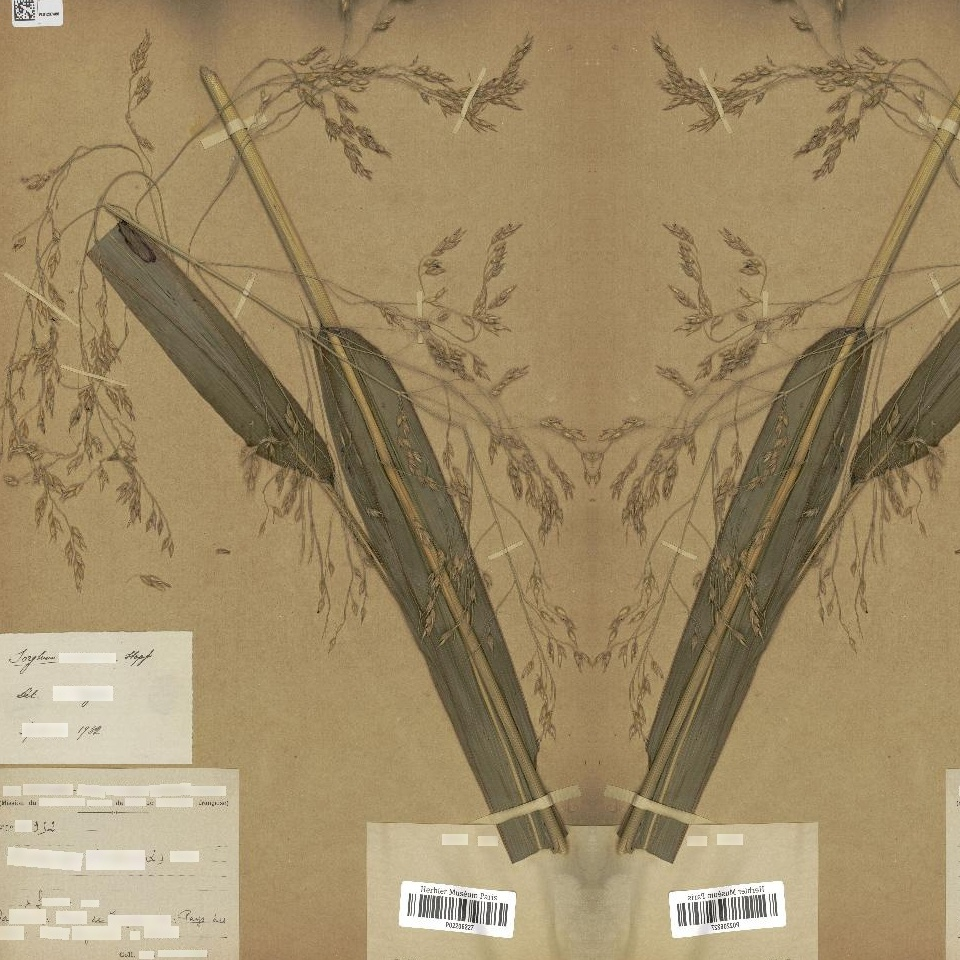

In [74]:
dataset[2051][1:]
dataset[2051][0]

dataset[2053][1:]
dataset[2053][0]

In [80]:
from rich import print as pp
from collections import Counter
import os
import tqdm
import PIL.Image

species_dir = "/media/data_cifs/projects/prj_fossils/data/raw_data/herbarium-2022-fgvc9_resize/train_images/104/11/"
known_broken_img_name = "10411__104.jpg"

others = [os.path.join(species_dir,p) for p in os.listdir(species_dir)] # if p != known_broken_img_name]

shapes = []

for path in tqdm(others):
    
    img = PIL.Image.open(path)
    shapes.append((img.size, path)) #, label, metadata))


counts = Counter([shape[0] for shape in shapes])
pp(counts)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:01<00:00, 48.52it/s]


Counter({(960, 960): 53, (460, 460): 1})

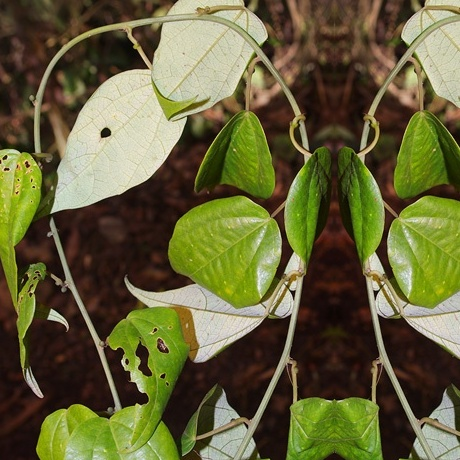

In [85]:
broken_path = Path(species_dir, known_broken_img_name)
PIL.Image.open(broken_path)

  0%|                                                                                                                                                                                                                  | 0/5 [00:00<?, ?it/s]

10411__016.jpg (960, 960)


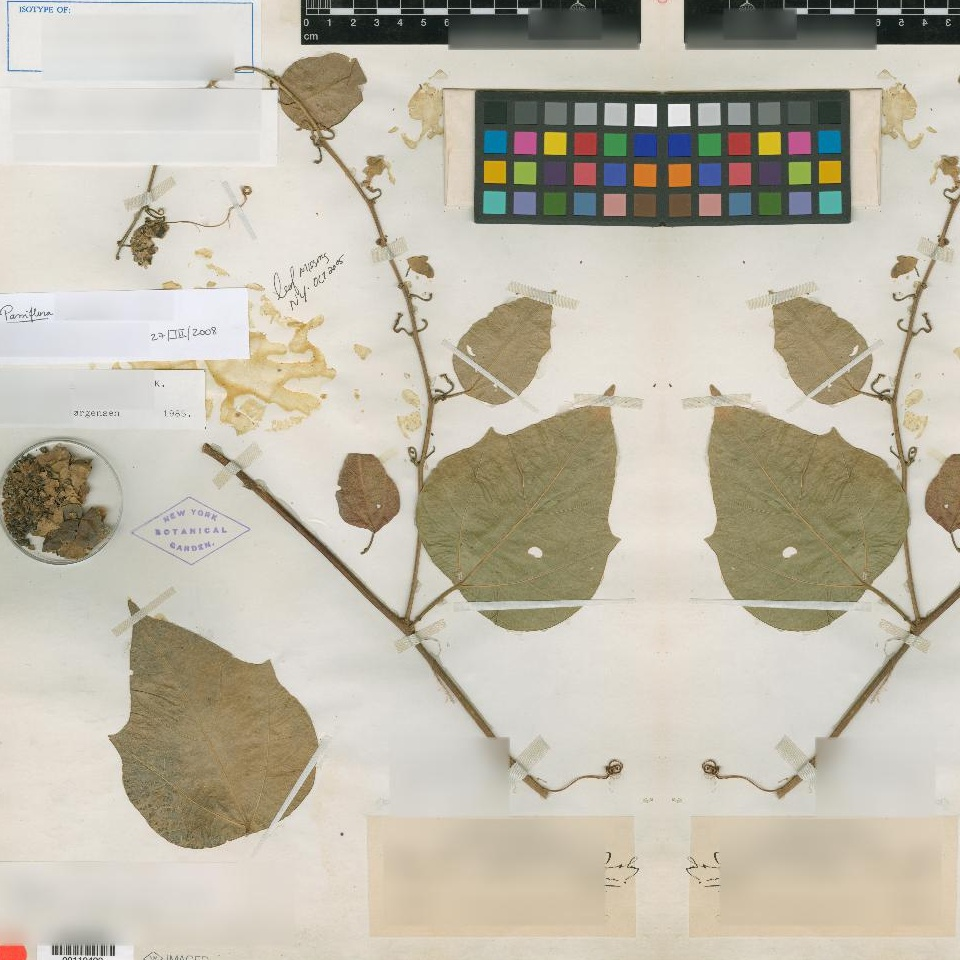

 20%|████████████████████████████████████████▍                                                                                                                                                                 | 1/5 [00:00<00:03,  1.04it/s]

10411__019.jpg (960, 960)


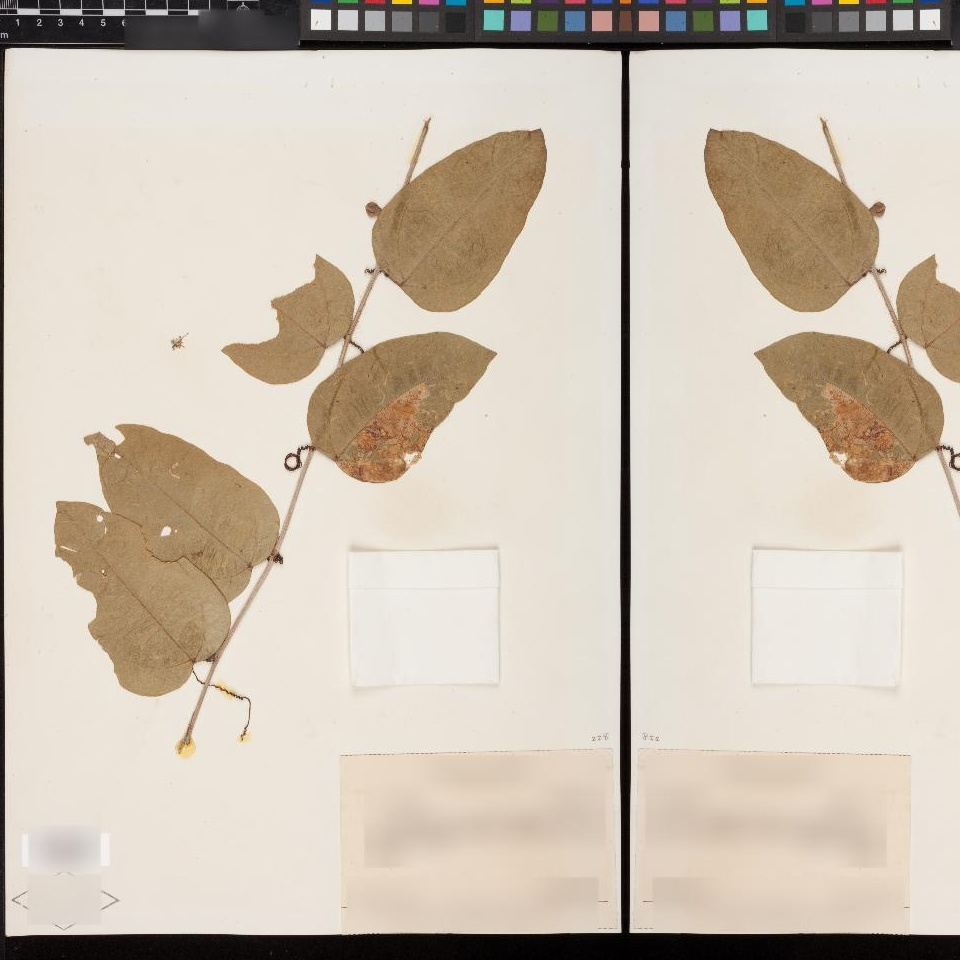

 40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                         | 2/5 [00:01<00:02,  1.32it/s]

10411__041.jpg (960, 960)


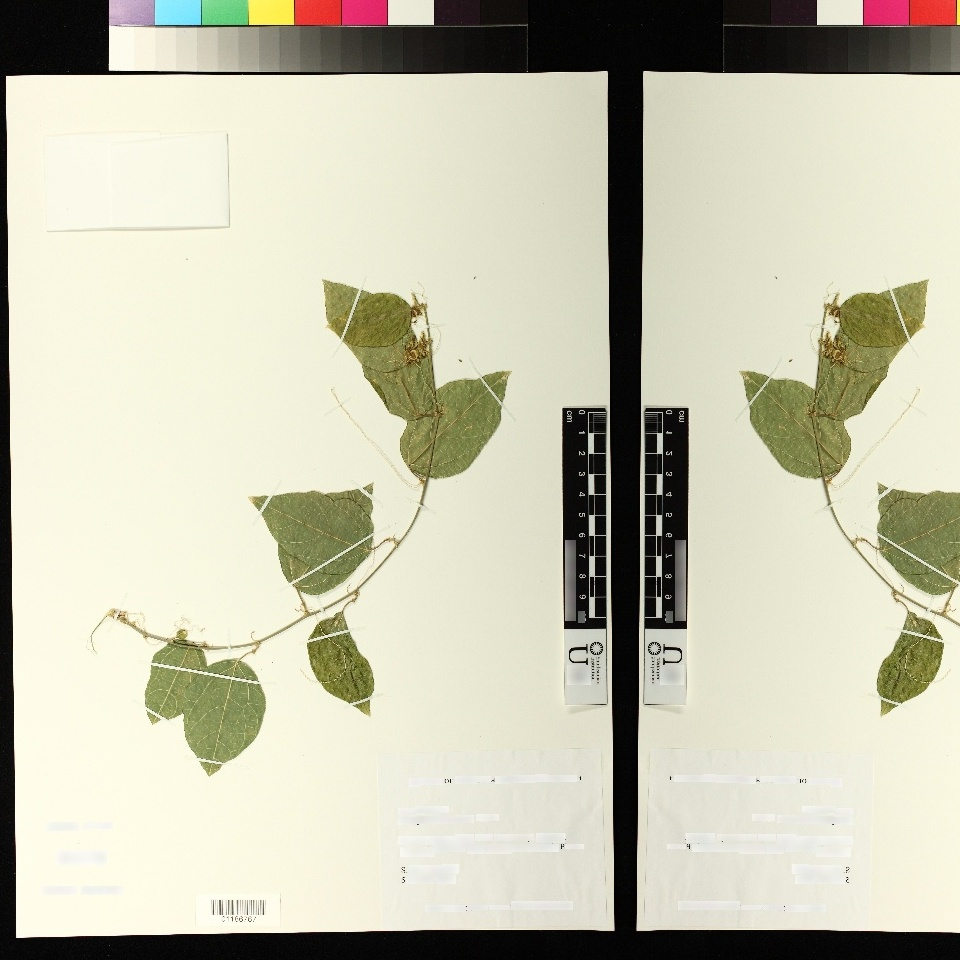

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3/5 [00:02<00:01,  1.20it/s]

10411__028.jpg (960, 960)


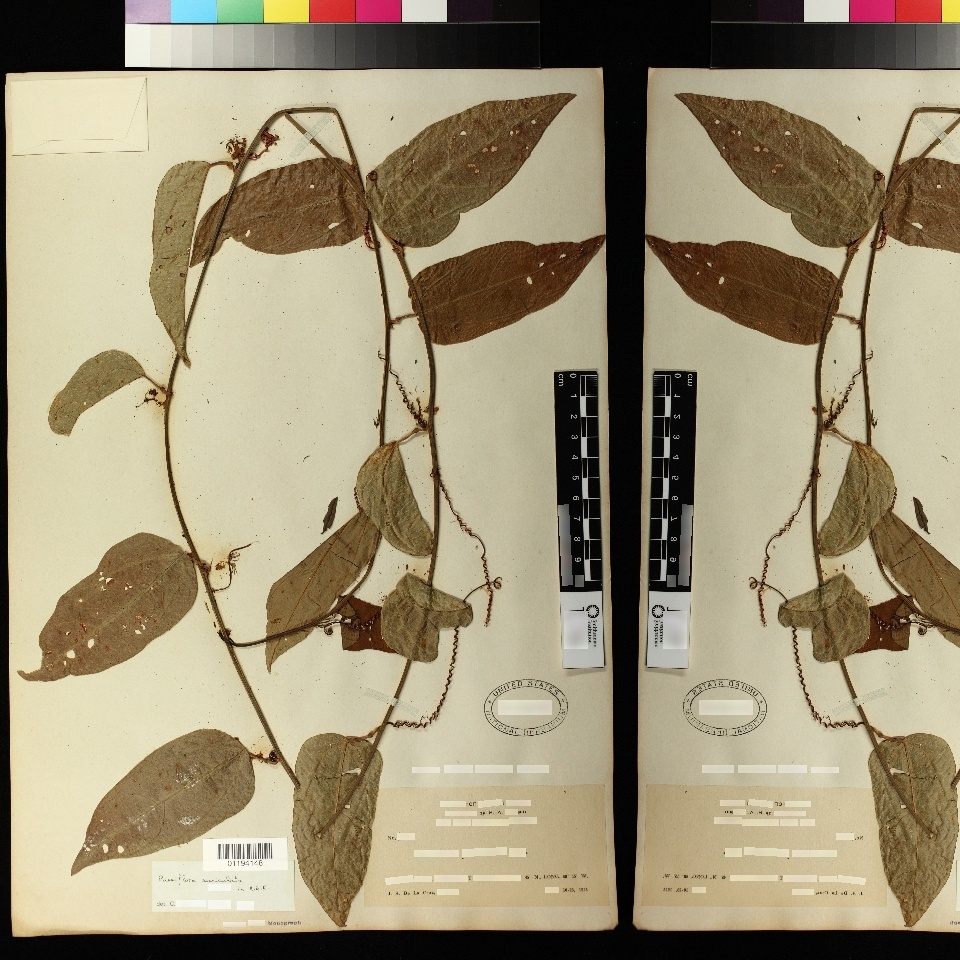

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4/5 [00:03<00:00,  1.05it/s]

10411__009.jpg (960, 960)


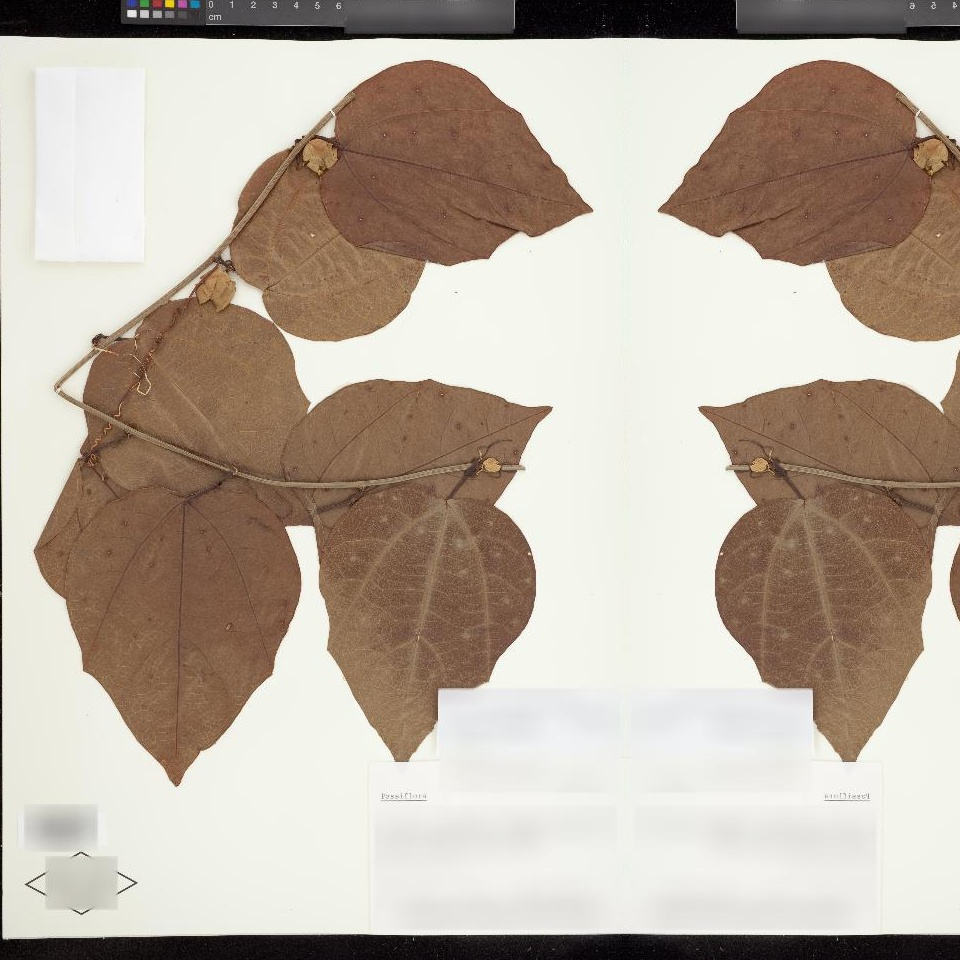

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:04<00:00,  1.15it/s]


In [84]:
import random

chosen = random.choices(others, k=5)

for path in tqdm(chosen):
    
    img = PIL.Image.open(path)
    print(Path(path).name, img.size)
    img



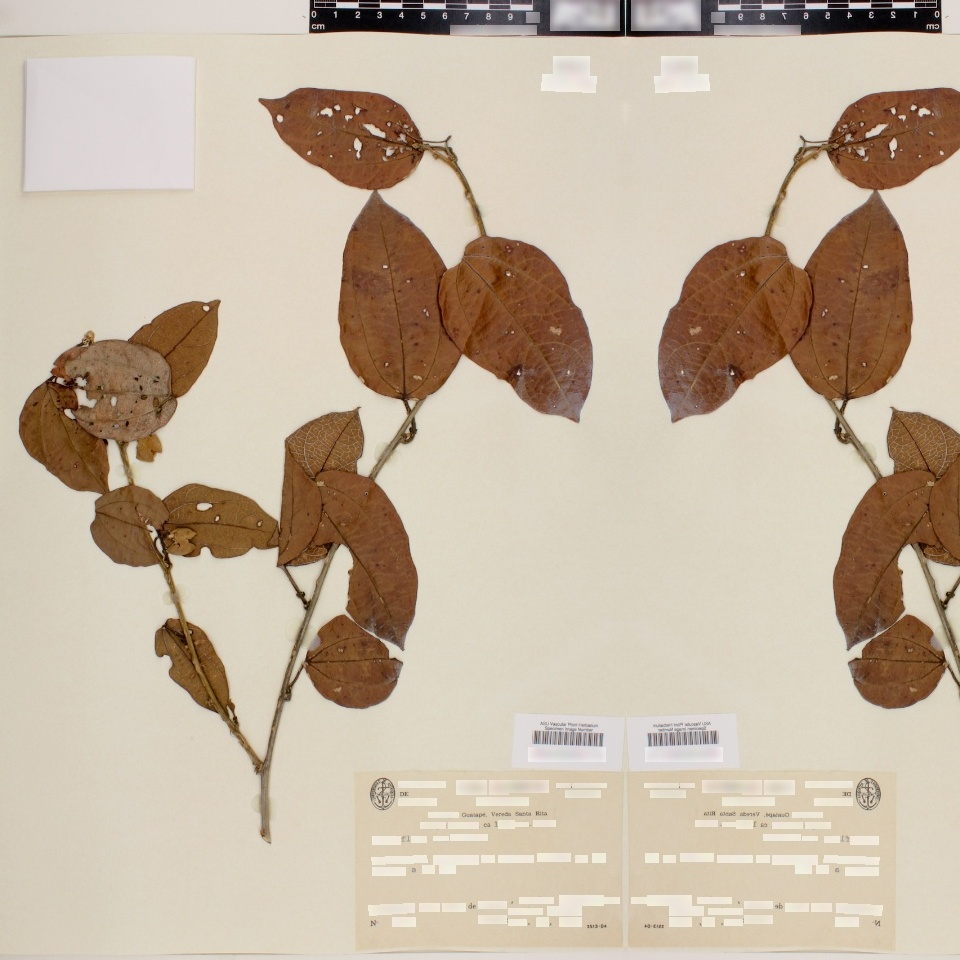

In [81]:
img

In [50]:
# batch_size = 1
for item in tqdm(iter(dataset), total=4135): #len(dataset)):
    # break
    pass

print(type(item), len(item))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4135/4135 [01:14<00:00, 55.16it/s]

<class 'tuple'> 3
CPU times: user 1min 14s, sys: 1.21 s, total: 1min 15s
Wall time: 1min 14s


(14752, '0000000')


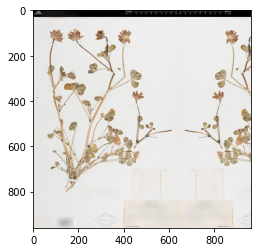

In [47]:
print(item[1:])
plt.imshow(item[0])

In [27]:
url = f'{SHARD_DIR}/herbarium_2022-val-000000.tar'

dataset = wds.WebDataset(url).decode("rgb").to_tuple("image.jpg","label.cls")

dataset


In [37]:
url = f'{SHARD_DIR}/herbarium_2022-test-000000.tar'

dataset = wds.WebDataset(url).decode("rgb").to_tuple("image.jpg","__key__")

dataset


In [44]:
for item in dataset:
    break
print(type(item))

for v in item:
    print(type(v))

item[1]

for k,v in item.items():
    print(k, type(v))

import matplotlib.pyplot as plt

plt.imshow(item[0])

In [ ]:
# catalog_dir = "/media/data/jacob/GitHub/image-utils/imutils/big/data/splits/train_size-0.7"

# subset = "train" # "val" # "test"
# catalog_name = f"{subset}_metadata.csv"

# catalog_path = Path(catalog_dir, catalog_name)
# label_col = "scientificName"
# label_name = f"{label_col}-encoder.pkl"
# label_encoder_path = Path(catalog_dir, label_name)		


# from imutils.big.make_train_val_splits import read_encoded_splits

# encoder, data = read_encoded_splits(source_dir=catalog_dir,
#                                     label_encoder_path=label_encoder_path,
#                                     include=["train","val","test"])

# train_data, val_data, test_data = data["train"], data["val"], data["test"]









setattr